<a href="https://colab.research.google.com/github/44REAM/CEB-image_processing/blob/main/Vision_Transformer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tutorial 15: Vision Transformers

![Status](https://img.shields.io/static/v1.svg?label=Status&message=Finished&color=green)

**Pre-trained models:**
[![View files on Github](https://img.shields.io/static/v1.svg?logo=github&label=Repo&message=View%20On%20Github&color=lightgrey)](https://github.com/phlippe/saved_models/tree/main/tutorial15)
[![GoogleDrive](https://img.shields.io/static/v1.svg?logo=google-drive&logoColor=yellow&label=GDrive&message=Download&color=yellow)](https://drive.google.com/drive/folders/1BmisSPs5BXQKpolyHp5X4klSAhpDx479?usp=sharing)   
**Recordings:**
[![YouTube - Part 1](https://img.shields.io/static/v1.svg?logo=youtube&label=YouTube&message=Part%201&color=red)](https://youtu.be/4UyBxlJChfc)   
**JAX+Flax version:**
[![View on RTD](https://img.shields.io/static/v1.svg?logo=readthedocs&label=RTD&message=View%20On%20RTD&color=8CA1AF)](https://uvadlc-notebooks.readthedocs.io/en/latest/tutorial_notebooks/JAX/tutorial15/Vision_Transformer.html)   
**Author:** Phillip Lippe

<div class="alert alert-info">

**Note:** Interested in JAX? Check out our [JAX+Flax version](https://uvadlc-notebooks.readthedocs.io/en/latest/tutorial_notebooks/JAX/tutorial15/Vision_Transformer.html) of this tutorial!
    
</div>

# Tranformer recap

Tranformer in inverted by Vaswani et al. in 2017 from Attention is all you need. It is a type of neural network architecture based on the multi-head attention mechanism. The Transformer architecture has continued to beat benchmarks in many domains, most importantly in Natural Language Processing. Transformers with an incredible amount of parameters can generate long, convincing essays, and opened up new application fields of AI. As the hype of the Transformer architecture seems not to come to an end in the next years, it is important to understand how it works, and have implemented it yourself, which we will do in this notebook.


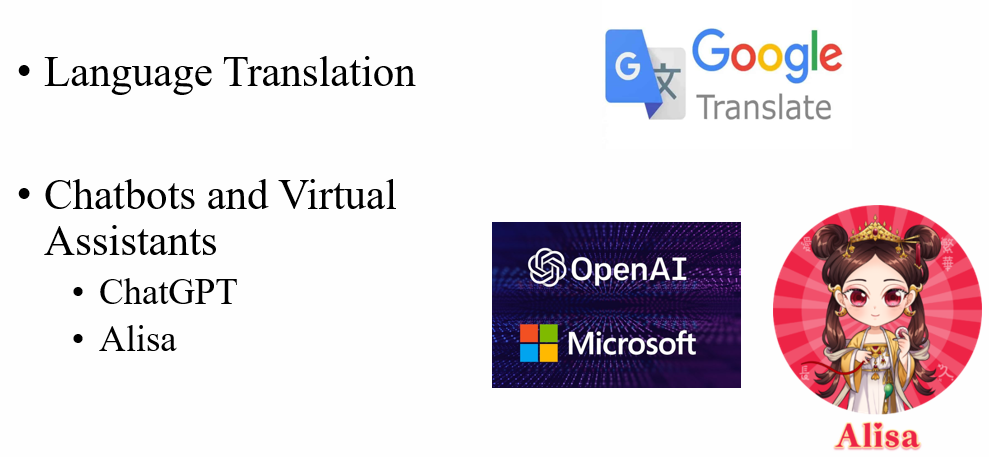

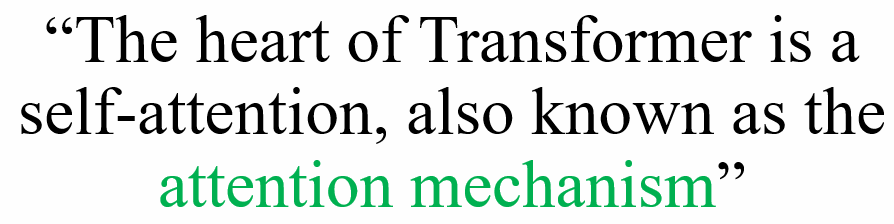

**What is attention mechanism in ML?**

> “The idea of incorporating a mechanism inspired by the human visual system into neural networks”

Derya Soydaner, 2022

> “The idea of incorporating a mechanism inspired by the human visual system into neural networksThe ability to dynamically highlight and use the salient parts of the information at hand”

Grace W. Lindsay 2020





##  From CNNs to Transformers
Convolutional Neural Networks (CNNs) have dominated computer vision for nearly a decade, but they come with inherent limitations. CNNs process images through **local receptive fields** that gradually expand through the network hierarchy. While effective, this approach struggles with capturing long-range dependencies and global context.

Transformers, originally designed for natural language processing, good at modeling long-range dependencies through their self-attention mechanism. This mechanism allows each element to attend to all other elements, creating a **global receptive field** from the very first layer.

## Transformer architecture

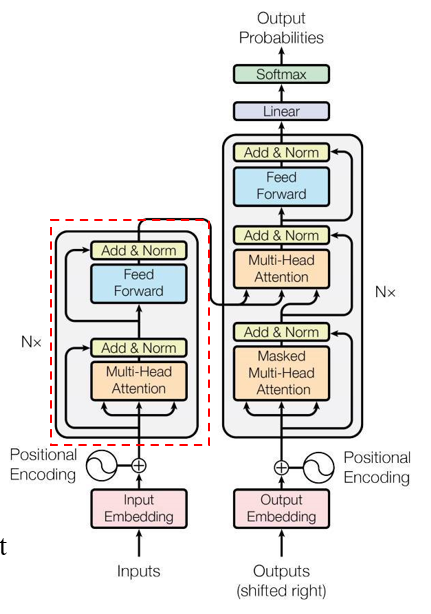

A Vision Transformer (ViT) adapts the Transformer architecture, originally for language, to image processing. Instead of pixels, images are split into sequences of fixed-size patches. These patches are then linearly embedded and combined with positional encodings, similar to words in a sentence, and fed into a standard Transformer encoder. The core of this process is the multi-head self-attention mechanism, which allows the model to learn **global relationships** between different image patches. Finally, the output of the Transformer encoder is passed through a classification head (e.g., a linear layer) to predict categories or perform other vision tasks.

## Positional encoder

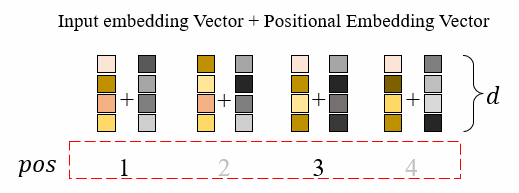

Positional Encoding is a crucial component in Transformer models that addresses their inherent lack of sequential awareness. Since Transformers process input tokens in parallel rather than sequentially, they need an explicit mechanism to understand the order or position of tokens within a sequence. As depicted, this is achieved by generating unique "positional embedding vectors" for each position, which are then added element-wise to the "input embedding vectors" (representing the semantic meaning of the tokens). This simple addition allows the combined representation to carry both semantic and positional information, enabling the self-attention mechanism to learn relationships that depend on the relative or absolute positions of tokens, which is vital for tasks like language translation or image recognition.

## Self attention

### Overview

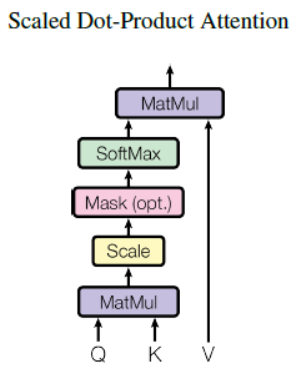

### Details

![image.png](figures_ViT/vit.png)

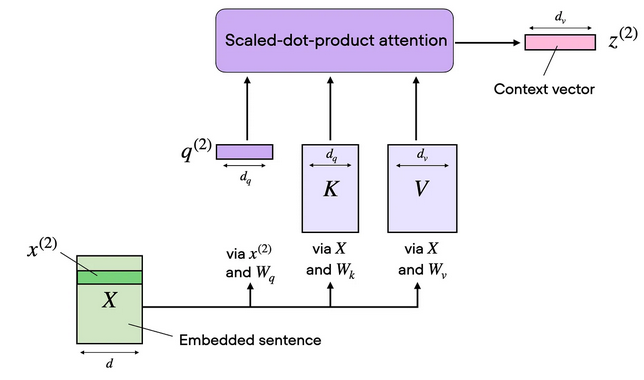

ref: https://magazine.sebastianraschka.com/p/understanding-and-coding-self-attention

![image.png](figures_ViT/vit_ex.png)

ref: https://blog.csdn.net/weixin_49587977/article/details/145302133

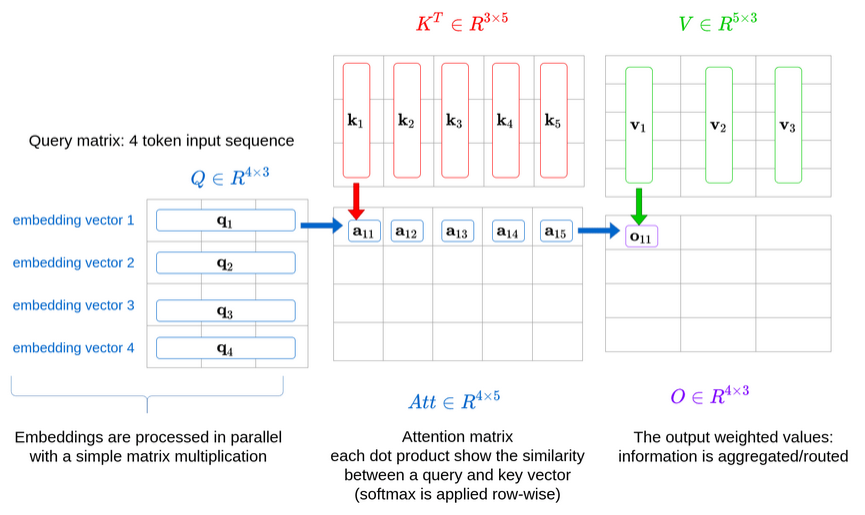


Self-attention, a core mechanism in Transformer models, allows a sequence to weigh the importance of different elements within itself when processing each element. As illustrated in the image, for each "query" embedding (e.g., $q_1$), it's compared against all "key" embeddings (e.g., $k_1$ to $k_4$) in the input sequence using a dot product, resulting in an "Attention matrix" ($Att$) where each score ($a_{ij}$) indicates the similarity or relevance between a query and a key. These similarity scores are then normalized (typically with a softmax function) and used as weights to create a weighted sum of the "value" embeddings, producing an "Output weighted values" ($O$) for each query. This process enables the model to effectively capture long-range dependencies and contextual relationships within the input sequence by allowing each part of the sequence to "attend" to other relevant parts.


ref: https://theaisummer.com/self-attention/

## Multihead self-attention

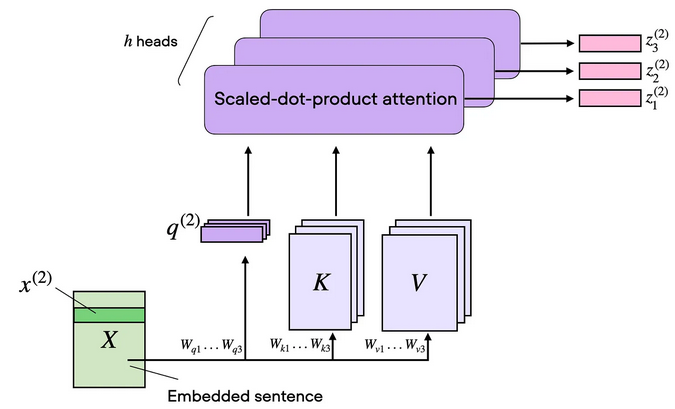

ref: https://magazine.sebastianraschka.com/p/understanding-and-coding-self-attention

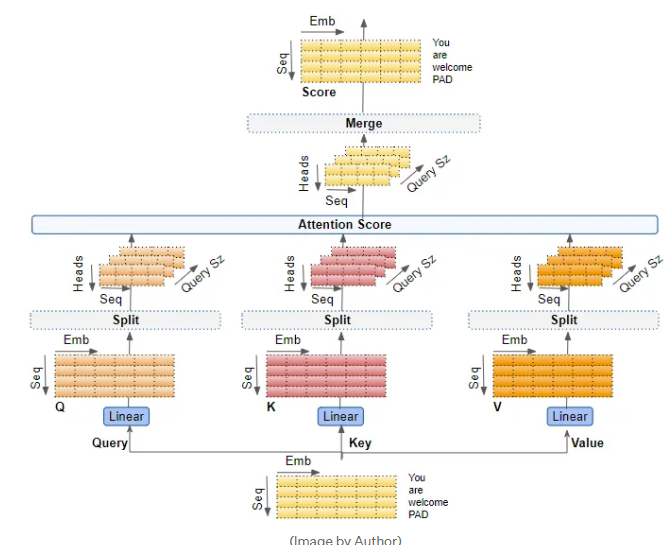

ref: https://towardsdatascience.com/transformers-explained-visually-part-3-multi-head-attention-deep-dive-1c1ff1024853

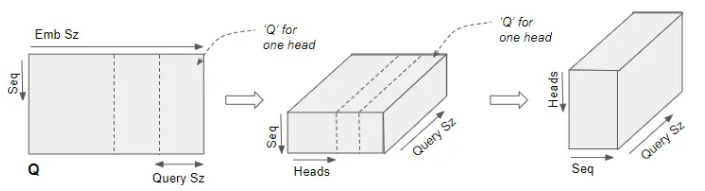

ref: https://towardsdatascience.com/transformers-explained-visually-part-3-multi-head-attention-deep-dive-1c1ff1024853

# Vision transformer Coding

In [1]:
## Standard libraries
import os
import numpy as np
import random
import math
import json
from functools import partial
from PIL import Image

## Imports for plotting
import matplotlib.pyplot as plt
plt.set_cmap('cividis')
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg', 'pdf') # For export
from matplotlib.colors import to_rgb
import matplotlib
matplotlib.rcParams['lines.linewidth'] = 2.0
import seaborn as sns
sns.reset_orig()

## tqdm for loading bars
from tqdm.notebook import tqdm

## PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
import torch.optim as optim

## Torchvision
import torchvision
from torchvision.datasets import CIFAR10
from torchvision import transforms

# PyTorch Lightning
try:
    import pytorch_lightning as pl
except ModuleNotFoundError: # Google Colab does not have PyTorch Lightning installed by default. Hence, we do it here if necessary
    !pip install --quiet pytorch-lightning>=1.4
    import pytorch_lightning as pl
from pytorch_lightning.callbacks import LearningRateMonitor, ModelCheckpoint

# Import tensorboard
%load_ext tensorboard

# Path to the folder where the datasets are/should be downloaded (e.g. CIFAR10)
DATASET_PATH = "../data"
# Path to the folder where the pretrained models are saved
CHECKPOINT_PATH = "../saved_models/tutorial15"

# Setting the seed
pl.seed_everything(42)

# Ensure that all operations are deterministic on GPU (if used) for reproducibility
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
print("Device:", device)

<ipython-input-1-4eb4ebd6ea16>:15: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('svg', 'pdf') # For export
INFO:lightning_fabric.utilities.seed:Seed set to 42


Device: cpu


<Figure size 640x480 with 0 Axes>

We provide a pre-trained Vision Transformer which we download in the next cell. However, Vision Transformers can be relatively quickly trained on CIFAR10 with an overall training time of less than an hour on an NVIDIA TitanRTX. Feel free to experiment with training your own Transformer once you went through the whole notebook.

In [2]:
import urllib.request
from urllib.error import HTTPError
# Github URL where saved models are stored for this tutorial
base_url = "https://raw.githubusercontent.com/phlippe/saved_models/main/"
# Files to download
pretrained_files = ["tutorial15/ViT.ckpt", "tutorial15/tensorboards/ViT/events.out.tfevents.ViT",
                    "tutorial5/tensorboards/ResNet/events.out.tfevents.resnet"]
# Create checkpoint path if it doesn't exist yet
os.makedirs(CHECKPOINT_PATH, exist_ok=True)

# For each file, check whether it already exists. If not, try downloading it.
for file_name in pretrained_files:
    file_path = os.path.join(CHECKPOINT_PATH, file_name.split("/",1)[1])
    if "/" in file_name.split("/",1)[1]:
        os.makedirs(file_path.rsplit("/",1)[0], exist_ok=True)
    if not os.path.isfile(file_path):
        file_url = base_url + file_name
        print(f"Downloading {file_url}...")
        try:
            urllib.request.urlretrieve(file_url, file_path)
        except HTTPError as e:
            print("Something went wrong. Please try to download the file from the GDrive folder, or contact the author with the full output including the following error:\n", e)

We load the CIFAR10 dataset below. We use the same setup of the datasets and data augmentations as for the CNNs in Tutorial 5 to keep a fair comparison. The constants in the `transforms.Normalize` correspond to the values that scale and shift the data to a zero mean and standard deviation of one.

100%|██████████| 170498071/170498071 [00:02<00:00, 77114770.67it/s]


Extracting ../data/cifar-10-python.tar.gz to ../data
Files already downloaded and verified


INFO:lightning_fabric.utilities.seed:Seed set to 42
INFO:lightning_fabric.utilities.seed:Seed set to 42


Files already downloaded and verified


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


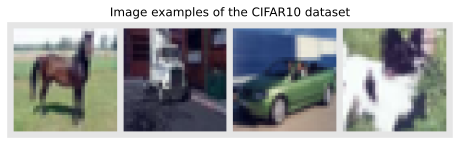

In [3]:
test_transform = transforms.Compose([transforms.ToTensor(),
                                     transforms.Normalize([0.49139968, 0.48215841, 0.44653091], [0.24703223, 0.24348513, 0.26158784])
                                     ])
# For training, we add some augmentation. Networks are too powerful and would overfit.
train_transform = transforms.Compose([transforms.RandomHorizontalFlip(),
                                      transforms.RandomResizedCrop((32,32),scale=(0.8,1.0),ratio=(0.9,1.1)),
                                      transforms.ToTensor(),
                                      transforms.Normalize([0.49139968, 0.48215841, 0.44653091], [0.24703223, 0.24348513, 0.26158784])
                                     ])
# Loading the training dataset. We need to split it into a training and validation part
# We need to do a little trick because the validation set should not use the augmentation.
train_dataset = CIFAR10(root=DATASET_PATH, train=True, transform=train_transform, download=True)
val_dataset = CIFAR10(root=DATASET_PATH, train=True, transform=test_transform, download=True)
pl.seed_everything(42)
train_set, _ = torch.utils.data.random_split(train_dataset, [45000, 5000])
pl.seed_everything(42)
_, val_set = torch.utils.data.random_split(val_dataset, [45000, 5000])

# Loading the test set
test_set = CIFAR10(root=DATASET_PATH, train=False, transform=test_transform, download=True)

# We define a set of data loaders that we can use for various purposes later.
train_loader = data.DataLoader(train_set, batch_size=128, shuffle=True, drop_last=True, pin_memory=True, num_workers=4)
val_loader = data.DataLoader(val_set, batch_size=128, shuffle=False, drop_last=False, num_workers=4)
test_loader = data.DataLoader(test_set, batch_size=128, shuffle=False, drop_last=False, num_workers=4)

# Visualize some examples
NUM_IMAGES = 4
CIFAR_images = torch.stack([val_set[idx][0] for idx in range(NUM_IMAGES)], dim=0)
img_grid = torchvision.utils.make_grid(CIFAR_images, nrow=4, normalize=True, pad_value=0.9)
img_grid = img_grid.permute(1, 2, 0)

plt.figure(figsize=(8,8))
plt.title("Image examples of the CIFAR10 dataset")
plt.imshow(img_grid)
plt.axis('off')
plt.show()
plt.close()

## Transformers for image classification

Transformers have been originally proposed to process sets since it is a permutation-equivariant architecture, i.e., producing the same output permuted if the input is permuted. To apply Transformers to sequences, we have simply added a positional encoding to the input feature vectors, and the model learned by itself what to do with it. So, why not do the same thing on images? This is exactly what [Alexey Dosovitskiy et al.](https://openreview.net/pdf?id=YicbFdNTTy) proposed in their paper "An Image is Worth 16x16 Words: Transformers for Image Recognition at Scale". Specifically, the Vision Transformer is a model for image classification that views images as sequences of smaller patches. As a preprocessing step, we split an image of, for example, $48\times 48$ pixels into 9 patches of size $16\times 16$ pixel. Each of those patches is considered to be a "word"/"token" and projected to a feature space. With adding positional encodings and a token for classification on top, we can apply a Transformer as usual to this sequence and start training it for our task. A nice GIF visualization of the architecture is shown below (figure credit - [Phil Wang](https://github.com/lucidrains/vit-pytorch/blob/main/images/vit.gif)):

<center width="100%"><img src="https://github.com/phlippe/uvadlc_notebooks/blob/master/docs/tutorial_notebooks/tutorial15/vit.gif?raw=1" width="600px"></center>

We will walk step by step through the Vision Transformer, and implement all parts by ourselves. First, let's implement the image preprocessing: an image of size $N\times N$ has to be split into $(N/M)^2$ patches of size $M\times M$. These represent the input words to the Transformer.

In [4]:
def img_to_patch(x, patch_size, flatten_channels=True):
    """
    Inputs:
        x - torch.Tensor representing the image of shape [B, C, H, W]
        patch_size - Number of pixels per dimension of the patches (integer)
        flatten_channels - If True, the patches will be returned in a flattened format
                           as a feature vector instead of a image grid.
    """
    B, C, H, W = x.shape
    x = x.reshape(B, C, H//patch_size, patch_size, W//patch_size, patch_size)
    x = x.permute(0, 2, 4, 1, 3, 5) # [B, H', W', C, p_H, p_W]
    x = x.flatten(1,2)              # [B, H'*W', C, p_H, p_W]
    if flatten_channels:
        x = x.flatten(2,4)          # [B, H'*W', C*p_H*p_W]
    return x

Let's take a look at how that works for our CIFAR examples above. For our images of size $32\times 32$, we choose a patch size of 4. Hence, we obtain sequences of 64 patches of size $4\times 4$. We visualize them below:

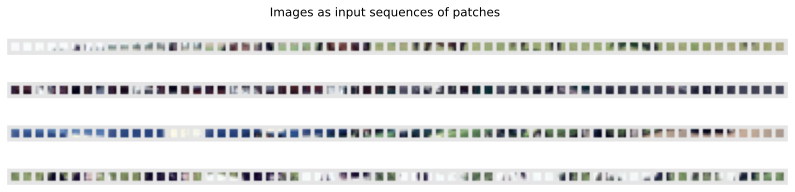

In [5]:
img_patches = img_to_patch(CIFAR_images, patch_size=4, flatten_channels=False)

fig, ax = plt.subplots(CIFAR_images.shape[0], 1, figsize=(14,3))
fig.suptitle("Images as input sequences of patches")
for i in range(CIFAR_images.shape[0]):
    img_grid = torchvision.utils.make_grid(img_patches[i], nrow=64, normalize=True, pad_value=0.9)
    img_grid = img_grid.permute(1, 2, 0)
    ax[i].imshow(img_grid)
    ax[i].axis('off')
plt.show()
plt.close()

Compared to the original images, it is much harder to recognize the objects from those patch lists now. Still, this is the input we provide to the Transformer for classifying the images. The model has to learn itself how it has to combine the patches to recognize the objects. The inductive bias in CNNs that an image is a grid of pixels, is lost in this input format.

After we have looked at the preprocessing, we can now start building the Transformer model. Since we have discussed the fundamentals of Multi-Head Attention in [Tutorial 6](https://uvadlc-notebooks.readthedocs.io/en/latest/tutorial_notebooks/tutorial6/Transformers_and_MHAttention.html), we will use the PyTorch module `nn.MultiheadAttention` ([docs](https://pytorch.org/docs/stable/generated/torch.nn.MultiheadAttention.html?highlight=multihead#torch.nn.MultiheadAttention)) here. Further, we use the Pre-Layer Normalization version of the Transformer blocks proposed by [Ruibin Xiong et al.](http://proceedings.mlr.press/v119/xiong20b/xiong20b.pdf) in 2020. The idea is to apply Layer Normalization not in between residual blocks, but instead as a first layer in the residual blocks. This reorganization of the layers supports better gradient flow and removes the necessity of a warm-up stage. A visualization of the difference between the standard Post-LN and the Pre-LN version is shown below.

<center width="100%"><img src="https://github.com/phlippe/uvadlc_notebooks/blob/master/docs/tutorial_notebooks/tutorial15/pre_layer_norm.svg?raw=1" width="400px"></center>

The implementation of the Pre-LN attention block looks as follows:

In [14]:
class AttentionBlock(nn.Module):

    def __init__(self, embed_dim, hidden_dim, num_heads, dropout=0.0):
        """
        Inputs:
            embed_dim - Dimensionality of input and attention feature vectors
            hidden_dim - Dimensionality of hidden layer in feed-forward network
                         (usually 2-4x larger than embed_dim)
            num_heads - Number of heads to use in the Multi-Head Attention block
            dropout - Amount of dropout to apply in the feed-forward network
        """
        super().__init__()

        self.layer_norm_1 = nn.LayerNorm(embed_dim)
        self.attn = nn.MultiheadAttention(embed_dim, num_heads,
                                          dropout=dropout)
        self.layer_norm_2 = nn.LayerNorm(embed_dim)
        self.linear = nn.Sequential(
            nn.Linear(embed_dim, hidden_dim),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, embed_dim),
            nn.Dropout(dropout)
        )


    def forward(self, x):
        inp_x = self.layer_norm_1(x)
        x = x + self.attn(inp_x, inp_x, inp_x)[0]
        x = x + self.linear(self.layer_norm_2(x))
        return x

Now we have all modules ready to build our own Vision Transformer. Besides the Transformer encoder, we need the following modules:

* A **linear projection** layer that maps the input patches to a feature vector of larger size. It is implemented by a simple linear layer that takes each $M\times M$ patch independently as input.
* A **classification token** that is added to the input sequence. We will use the output feature vector of the classification token (CLS token in short) for determining the classification prediction.
* Learnable **positional encodings** that are added to the tokens before being processed by the Transformer. Those are needed to learn position-dependent information, and convert the set to a sequence. Since we usually work with a fixed resolution, we can learn the positional encodings instead of having the pattern of sine and cosine functions.
* An **MLP head** that takes the output feature vector of the CLS token, and maps it to a classification prediction. This is usually implemented by a small feed-forward network or even a single linear layer.

With those components in mind, let's implement the full Vision Transformer below:

In [15]:
class VisionTransformer(nn.Module):

    def __init__(self, embed_dim, hidden_dim, num_channels, num_heads, num_layers, num_classes, patch_size, num_patches, dropout=0.0):
        """
        Inputs:
            embed_dim - Dimensionality of the input feature vectors to the Transformer
            hidden_dim - Dimensionality of the hidden layer in the feed-forward networks
                         within the Transformer
            num_channels - Number of channels of the input (3 for RGB)
            num_heads - Number of heads to use in the Multi-Head Attention block
            num_layers - Number of layers to use in the Transformer
            num_classes - Number of classes to predict
            patch_size - Number of pixels that the patches have per dimension
            num_patches - Maximum number of patches an image can have
            dropout - Amount of dropout to apply in the feed-forward network and
                      on the input encoding
        """
        super().__init__()

        self.patch_size = patch_size

        # Layers/Networks
        self.input_layer = nn.Linear(num_channels*(patch_size**2), embed_dim)
        self.transformer = nn.Sequential(*[AttentionBlock(embed_dim, hidden_dim, num_heads, dropout=dropout) for _ in range(num_layers)])
        self.mlp_head = nn.Sequential(
            nn.LayerNorm(embed_dim),
            nn.Linear(embed_dim, num_classes)
        )
        self.dropout = nn.Dropout(dropout)

        # Parameters/Embeddings
        self.cls_token = nn.Parameter(torch.randn(1,1,embed_dim))
        self.pos_embedding = nn.Parameter(torch.randn(1,1+num_patches,embed_dim))


    def forward(self, x):
        # Preprocess input
        x = img_to_patch(x, self.patch_size)
        B, T, _ = x.shape
        x = self.input_layer(x)

        # Add CLS token and positional encoding
        cls_token = self.cls_token.repeat(B, 1, 1)
        x = torch.cat([cls_token, x], dim=1)
        x = x + self.pos_embedding[:,:T+1]

        # Apply Transforrmer
        x = self.dropout(x)
        x = x.transpose(0, 1)
        x = self.transformer(x)

        # Perform classification prediction
        cls = x[0]
        out = self.mlp_head(cls)
        return out

Finally, we can put everything into a PyTorch Lightning Module as usual. We use `torch.optim.AdamW` as the optimizer, which is Adam with a corrected weight decay implementation. Since we use the Pre-LN Transformer version, we do not need to use a learning rate warmup stage anymore. Instead, we use the same learning rate scheduler as the CNNs in our previous tutorial on image classification.

In [16]:
class ViT(pl.LightningModule):

    def __init__(self, model_kwargs, lr):
        super().__init__()
        self.save_hyperparameters()
        self.model = VisionTransformer(**model_kwargs)
        self.example_input_array = next(iter(train_loader))[0]

    def forward(self, x):
        return self.model(x)

    def configure_optimizers(self):
        optimizer = optim.AdamW(self.parameters(), lr=self.hparams.lr)
        lr_scheduler = optim.lr_scheduler.MultiStepLR(optimizer, milestones=[100,150], gamma=0.1)
        return [optimizer], [lr_scheduler]

    def _calculate_loss(self, batch, mode="train"):
        imgs, labels = batch
        preds = self.model(imgs)
        loss = F.cross_entropy(preds, labels)
        acc = (preds.argmax(dim=-1) == labels).float().mean()

        self.log(f'{mode}_loss', loss)
        self.log(f'{mode}_acc', acc)
        return loss

    def training_step(self, batch, batch_idx):
        loss = self._calculate_loss(batch, mode="train")
        return loss

    def validation_step(self, batch, batch_idx):
        self._calculate_loss(batch, mode="val")

    def test_step(self, batch, batch_idx):
        self._calculate_loss(batch, mode="test")

## Experiments

Commonly, Vision Transformers are applied to large-scale image classification benchmarks such as ImageNet to leverage their full potential. However, here we take a step back and ask: can Vision Transformer also succeed on classical, small benchmarks such as CIFAR10? To find this out, we train a Vision Transformer from scratch on the CIFAR10 dataset. Let's first create a training function for our PyTorch Lightning module which also loads the pre-trained model if you have downloaded it above.

In [17]:
def train_model(**kwargs):
    trainer = pl.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, "ViT"),
                         accelerator="gpu" if str(device).startswith("cuda") else "cpu",
                         devices=1,
                         max_epochs=180,
                         callbacks=[ModelCheckpoint(save_weights_only=True, mode="max", monitor="val_acc"),
                                    LearningRateMonitor("epoch")])
    trainer.logger._log_graph = True         # If True, we plot the computation graph in tensorboard
    trainer.logger._default_hp_metric = None # Optional logging argument that we don't need

    # Check whether pretrained model exists. If yes, load it and skip training
    pretrained_filename = os.path.join(CHECKPOINT_PATH, "ViT.ckpt")
    if os.path.isfile(pretrained_filename):
        print(f"Found pretrained model at {pretrained_filename}, loading...")
        model = ViT.load_from_checkpoint(pretrained_filename) # Automatically loads the model with the saved hyperparameters
    else:
        pl.seed_everything(42) # To be reproducable
        model = ViT(**kwargs)
        trainer.fit(model, train_loader, val_loader)
        model = ViT.load_from_checkpoint(trainer.checkpoint_callback.best_model_path) # Load best checkpoint after training

    # Test best model on validation and test set
    val_result = trainer.test(model, val_loader, verbose=False)
    test_result = trainer.test(model, test_loader, verbose=False)
    result = {"test": test_result[0]["test_acc"], "val": val_result[0]["test_acc"]}

    return model, result

Now, we can already start training our model. As seen in our implementation, we have a couple of hyperparameters that we have to set. When creating this notebook, we have performed a small grid search over hyperparameters and listed the best hyperparameters in the cell below. Nevertheless, it is worth discussing the influence that each hyperparameter has, and what intuition we have for choosing its value.

First, let's consider the patch size. The smaller we make the patches, the longer the input sequences to the Transformer become. While in general, this allows the Transformer to model more complex functions, it requires a longer computation time due to its quadratic memory usage in the attention layer. Furthermore, small patches can make the task more difficult since the Transformer has to learn which patches are close-by, and which are far away. We experimented with patch sizes of 2, 4, and 8 which gives us the input sequence lengths of 256, 64, and 16 respectively. We found 4 to result in the best performance and hence pick it below.

Next, the embedding and hidden dimensionality have a similar impact on a Transformer as to an MLP. The larger the sizes, the more complex the model becomes, and the longer it takes to train. In Transformers, however, we have one more aspect to consider: the query-key sizes in the Multi-Head Attention layers. Each key has the feature dimensionality of `embed_dim/num_heads`. Considering that we have an input sequence length of 64, a minimum reasonable size for the key vectors is 16 or 32. Lower dimensionalities can restrain the possible attention maps too much. We observed that more than 8 heads are not necessary for the Transformer, and therefore pick an embedding dimensionality of `256`. The hidden dimensionality in the feed-forward networks is usually 2-4x larger than the embedding dimensionality, and thus we pick `512`.

Finally, the learning rate for Transformers is usually relatively small, and in papers, a common value to use is 3e-5. However, since we work with a smaller dataset and have a potentially easier task, we found that we are able to increase the learning rate to 3e-4 without any problems. To reduce overfitting, we use a dropout value of 0.2. Remember that we also use small image augmentations as regularization during training.

Feel free to explore the hyperparameters yourself by changing the values below. In general, the Vision Transformer did not show to be too sensitive to the hyperparameter choices on the CIFAR10 dataset.

In [18]:
model, results = train_model(model_kwargs={
                                'embed_dim': 256,
                                'hidden_dim': 512,
                                'num_heads': 8,
                                'num_layers': 6,
                                'patch_size': 4,
                                'num_channels': 3,
                                'num_patches': 64,
                                'num_classes': 10,
                                'dropout': 0.2
                            },
                            lr=3e-4)
print("ViT results", results)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.migration.utils:Lightning automatically upgraded your loaded checkpoint from v1.6.4 to v2.3.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint ../saved_models/tutorial15/ViT.ckpt`


Found pretrained model at ../saved_models/tutorial15/ViT.ckpt, loading...


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Testing: |          | 0/? [00:00<?, ?it/s]

Testing: |          | 0/? [00:00<?, ?it/s]

ViT results {'test': 0.7713000178337097, 'val': 0.7781999707221985}


The Vision Transformer achieves a validation and test performance of about 75%. In comparison, almost all CNN architectures that we have tested in [Tutorial 5](https://uvadlc-notebooks.readthedocs.io/en/latest/tutorial_notebooks/tutorial5/Inception_ResNet_DenseNet.html) obtained a classification performance of around 90%. This is a considerable gap and shows that although Vision Transformers perform strongly on ImageNet with potential pretraining, they cannot come close to simple CNNs on CIFAR10 when being trained from scratch. The differences between a CNN and Transformer can be well observed in the training curves. Let's look at them in a tensorboard below:

In [19]:
# Opens tensorboard in notebook. Adjust the path to your CHECKPOINT_PATH!
%tensorboard --logdir ../saved_models/tutorial15/tensorboards/

<IPython.core.display.Javascript object>

<center><img src="https://github.com/phlippe/uvadlc_notebooks/blob/master/docs/tutorial_notebooks/tutorial15/tensorboard_screenshot.png?raw=1" width="100%"/></center>

![vit_cnn.png](figures_ViT/vit_cnn.png)

image ref: https://blog.aitoolhouse.com/vits-vs-cnns-in-ai-image-processing/

The tensorboard compares the Vision Transformer to a ResNet trained on CIFAR10. When looking at the training losses, we see that the ResNet learns much more quickly in the first iterations. While the learning rate might have an influence on the initial learning speed, we see the same trend in the validation accuracy. The ResNet achieves the best performance of the Vision Transformer after just 5 epochs (2000 iterations). Further, while the ResNet training loss and validation accuracy have a similar trend, the validation performance of the Vision Transformers only marginally changes after 10k iterations while the training loss has almost just started going down. Yet, the Vision Transformer is also able to achieve close to 100% accuracy on the training set.

All those observed phenomenons can be explained with a concept that we have visited before: **inductive biases**. Convolutional Neural Networks have been designed with the assumption that images are **translation invariant**. Hence, we apply convolutions with shared filters across the image. Furthermore, a CNN architecture integrates the concept of distance in an image: two pixels **that are close to each other are more related than two distant pixels**. **Local** patterns are combined into larger patterns until we perform our classification prediction. All those aspects are **inductive biases** of a CNN. In contrast, a Vision Transformer does not know which two pixels are close to each other, and which are far apart. It has to learn this information solely from the sparse learning signal of the classification task. **This is a huge disadvantage when we have a small dataset since such information is crucial for generalizing to an unseen test dataset**. With large enough datasets and/or good pre-training, a Transformer can learn this information without the need for inductive biases, and instead is more flexible than a CNN. Especially long-distance relations between local patterns can be difficult to process in CNNs, while in Transformers, all patches have the distance of one. This is why Vision Transformers are so strong on large-scale datasets such as ImageNet but underperform a lot when being applied to a small dataset such as CIFAR10.

![vit_cnn.png](figures_ViT/vit_cnn2.png)

ref image: https://medium.com/@hassaanidrees7/vision-transformer-vs-cnn-a-comparison-of-two-image-processing-giants-d6c85296f34f

# Advance Vision transformer architectures

![vit_cnn.png](figures_ViT/receptive_field.png)

ref image: 	[arXiv:2201.00520](https://arxiv.org/abs/2201.00520)

## Swin Transformer (https://arxiv.org/abs/2103.14030)

https://medium.com/data-science/a-comprehensive-guide-to-swin-transformer-64965f89d14c

Video: https://www.youtube.com/watch?v=SndHALawoag

https://www.youtube.com/watch?v=tFYxJZBAbE8

The Swin (Shifted Window) Transformer addresses two key limitations of ViT:
- Computational Efficiency: ViT's attention **computation scales quadratically with image size**, making it impractical for high-resolution images or dense prediction tasks.
- Multi-scale Feature Hierarchy: ViT produces single-scale features, while many vision tasks benefit from **multi-scale representations**.

![vit_cnn.png](figures_ViT/swin_compare.png)

ref image: Khan, M., Hanan, A., Kenzhebay, M. et al. Transformer-based land use and land cover classification with explainability using satellite imagery. Sci Rep 14, 16744 (2024). 

### Swin Transformer characteristic

![vit_cnn.png](figures_ViT/swin_arch.png)

ref image: https://arxiv.org/abs/2103.14030

- Hierarchical Feature Maps
Swin Transformer processes images in a hierarchical manner:
Starts with small patches (typically 4×4 pixels).
Progressively merges patches in deeper stages.
Doubles the channel capacity when spatial resolution is reduced.
Creates a pyramid of feature maps similar to CNNs.

- Window-based Self-Attention
Instead of global attention across all patches:
Computes self-attention within local windows (typically 7×7 patches).
Reduces complexity from O(n²) to O(w²·n), where w is window size.
Enables processing of high-resolution images.

- Shifted Window Mechanism
To connect different windows:
Alternates between regular window partitioning and shifted window partitioning.
In shifted windows, the grid is offset by (⌊M/2⌋, ⌊M/2⌋).
Creates connections between neighboring windows from the previous layer.
Enables information flow across windows while maintaining efficiency.




## Deformable Attention Transformer (DAT) (https://arxiv.org/abs/2201.00520)

https://medium.com/@jelkhoury880/introducing-deformable-attention-transformer-ddb8b5363c5c

Deformable Attention Transformer (DAT) addresses the limitations of fixed attention patterns by introducing learnable, content-dependent sampling locations.

Motivation
- Standard self-attention treats all spatial locations equally, which is inefficient since not all locations contribute equally to the final prediction. 
- DAT introduces:
    - Sparse, adaptive sampling of key points
    - Content-dependent attention fields
    - Efficient modeling of irregular and long-range dependencies

This is similar idea to Deformable Convolutional Network.

### Deformable Convolutional Network

https://medium.com/@alejandro.itoaramendia/deformable-convolutional-networks-a-complete-guide-eadd9f1f8ce2

Video: https://www.youtube.com/watch?v=6TtOuVJ9GBQ

![vit_cnn.png](figures_ViT/deform_cnn.png)

ref image: https://ieeexplore.ieee.org/document/8237351



### DAT characteristic


- Deformable Attention Mechanism

    - Reference Points: For each query position, the model defines a reference point in the 2D space.
    - Offset Prediction: A lightweight network predicts offsets from these reference points based on input features.
    - Sampling Locations: The reference point plus offsets determine where to sample keys and values.
    - Attention Computation: Attention is computed only at these sparse sampling locations.
The deformable attention operation can be expressed as:
DeformAttn(q, x, p) = ∑ᵏ A(q, xₖ) · W · x(p + Δpₖ)
Where:
q is the query feature
x is the input feature map
p is the reference point
Δpₖ are the learned offsets
A(q, xₖ) is the attention weight
k ranges over a small set of sampling points

![vit_cnn.png](figures_ViT/dat_arch.png)

ref image: 	[arXiv:2201.00520](https://arxiv.org/abs/2201.00520)

The reason why deformable attention is adopted only in the latter half of the process is that the ViT model tends to prefer local recognition in the early stages of recognition, and in order to reduce the amount of computation, deformable attention is adopted only in the second half.

- Advantages of DAT
Efficiency: Computes attention only at a small set of key points (typically 4-16 points)
Flexibility: Adapts the receptive field based on content
Geometric Awareness: Better models geometric transformations and object deformations
Performance: Particularly effective for tasks requiring precise spatial localization



![vit_cnn.png](figures_ViT/receptive_field.png)

ref image: 	[arXiv:2201.00520](https://arxiv.org/abs/2201.00520)

# ViT Applications

## UNet

![vit_cnn.png](figures_ViT/unet.png)

ref image: https://www.themoonlight.io/en/review/evit-unet-u-net-like-efficient-vision-transformer-for-medical-image-segmentation-on-mobile-and-edge-devices

https://arxiv.org/abs/2410.15036


### TransUNet

![image.png](figures_ViT/transunet.png)

ref: https://github.com/awsaf49/TransUNet-tf

### Swin-Unet

![vit_cnn.png](figures_ViT/swinunet.png)

ref image: https://sh-tsang.medium.com/review-swin-unet-unet-like-pure-transformer-for-medical-image-segmentation-63006c850f86


# Conclusion

In this tutorial, we have implemented our own Vision Transformer from scratch and applied it to the task of image classification. Vision Transformers work by splitting an image into a sequence of smaller patches, use those as input to a standard Transformer encoder. While Vision Transformers achieved outstanding results on large-scale image recognition benchmarks such as ImageNet, they considerably underperform when being trained from scratch on small-scale datasets like CIFAR10. The reason is that in contrast to CNNs, Transformers do not have the inductive biases of translation invariance and the feature hierarchy (i.e. larger patterns consist of many smaller patterns). However, these aspects can be learned when enough data is provided, or the model has been pre-trained on other large-scale tasks. Considering that Vision Transformers have just been proposed end of 2020, there is likely a lot more to come on Transformers for Computer Vision.


### References

Dosovitskiy, Alexey, et al. "An image is worth 16x16 words: Transformers for image recognition at scale." International Conference on Learning Representations (2021). [link](https://arxiv.org/pdf/2010.11929.pdf)

Chen, Xiangning, et al. "When Vision Transformers Outperform ResNets without Pretraining or Strong Data Augmentations." arXiv preprint arXiv:2106.01548 (2021). [link](https://arxiv.org/abs/2106.01548)

Tolstikhin, Ilya, et al. "MLP-mixer: An all-MLP Architecture for Vision." arXiv preprint arXiv:2105.01601 (2021). [link](https://arxiv.org/abs/2105.01601)

Xiong, Ruibin, et al. "On layer normalization in the transformer architecture." International Conference on Machine Learning. PMLR, 2020. [link](http://proceedings.mlr.press/v119/xiong20b/xiong20b.pdf)

---

[![Star our repository](https://img.shields.io/static/v1.svg?logo=star&label=⭐&message=Star%20Our%20Repository&color=yellow)](https://github.com/phlippe/uvadlc_notebooks/)  If you found this tutorial helpful, consider ⭐-ing our repository.    
[![Ask questions](https://img.shields.io/static/v1.svg?logo=star&label=❔&message=Ask%20Questions&color=9cf)](https://github.com/phlippe/uvadlc_notebooks/issues)  For any questions, typos, or bugs that you found, please raise an issue on GitHub.

---